In [33]:
import pandas as pd
import numpy as np

In [34]:
sub_1 = "/Users/jahrios/Documents/Stanford/PoldrackLab/Projects/SharedControl/Data/raw/sub-s001/shared_control/data_sub-s001_ses-001.csv"
sub_2 = "/Users/jahrios/Documents/Stanford/PoldrackLab/Projects/SharedControl/Data/raw/sub-s002/shared_control/data_sub-s002_ses-001.csv"
sub_3 = "/Users/jahrios/Documents/Stanford/PoldrackLab/Projects/SharedControl/Data/raw/sub-s003/shared_control/data_sub-s003_ses-001.csv"

In [35]:
def string_to_numbers(string_data):
    if isinstance(string_data, float):  # Check if the input is already a float
        return [string_data]  # If it's a float, return it as a list
    string_data = string_data.strip("'")  # Remove leading and trailing single quotes
    numbers = [float(num) for num in string_data.split()]
    return numbers

In [65]:
def process_trial_data(data):
    trial_results = {}
    ssrt_list = []

    for idx, row in data.iterrows():
        trial_number = idx
        stop_onset = row['SSD_mean']    
        time_stamps = row['time_stamps_raw']
        closest_time = min(time_stamps, key=lambda x: abs(x - stop_onset))
        index_of_closest = time_stamps.index(closest_time)
        raw_pressure = row['pressures_raw'][index_of_closest]

        trial_results[trial_number] = {
            'stop_onset': stop_onset,
            'closest_time': closest_time,
            'index_of_closest': index_of_closest,
            'raw_pressure': raw_pressure,
            'distances_raw': row['distances_raw'],
            'pressures_raw': row['pressures_raw'],
            'time_stamps_raw': row['time_stamps_raw'],
            'condition': row['condition']
        }

    for trial_number, trial_data in trial_results.items():
        index_of_closest = trial_data['index_of_closest']
        pressures_raw = trial_data['pressures_raw']
        time_stamps_raw = trial_data['time_stamps_raw']

        found_stop_pressure = None
        stop_moment = None
        for i in range(index_of_closest + 1, len(pressures_raw)):
            if pressures_raw[i] == 0:
                found_stop_pressure = pressures_raw[i]
                stop_moment = time_stamps_raw[i]
                break

        lower_pressure_timestamp = None
        index_of_inhibition = None
        if found_stop_pressure is not None:
            for i in range(index_of_closest + 1, len(pressures_raw)):
                if pressures_raw[i] < pressures_raw[index_of_closest]:
                    lower_pressure_timestamp = time_stamps_raw[i]
                    index_of_inhibition = i
                    break

        trial_data['stop_pressure'] = found_stop_pressure
        trial_data['stop_moment'] = stop_moment
        trial_data['moment_of_inhibition'] = lower_pressure_timestamp
        trial_data['index_of_inhibition'] = index_of_inhibition

        stop_onset = trial_data['stop_moment']
        moment_of_inhibition = trial_data['moment_of_inhibition']

        if stop_onset is not None and moment_of_inhibition is not None:
            ssrt = stop_onset - moment_of_inhibition
            ssrt_list.append(ssrt)
        else:
            ssrt_list.append(np.nan)

    return trial_results, ssrt_list

In [37]:
df = pd.read_csv(sub_1)
df['phase_raw'] = df['phase_raw'].str.strip("'")
df['block_raw'] = df['block_raw'].str.strip("'")

df_test = df.query("phase_raw == 'test'")
block_1 = df_test.query("block_raw == 'block 1'")
block_2 = df_test.query("block_raw == 'block 2'")
block_1 = block_1.reset_index(drop=True)
block_2 = block_2.reset_index(drop=True)

task_dfs = [block_1, block_2]

for df in task_dfs:
    if 'ai' in df['condition'].values:
        ai_data = df.copy()
        ai_data['distances_raw'] = ai_data['distances_raw'].apply(string_to_numbers)
        ai_data['pressures_raw'] = ai_data['pressures_raw'].apply(string_to_numbers)
        ai_data['time_stamps_raw'] = ai_data['time_stamps_raw'].apply(string_to_numbers)
    else:
        control_data = df.copy()
        control_data['distances_raw'] = control_data['distances_raw'].apply(string_to_numbers)
        control_data['pressures_raw'] = control_data['pressures_raw'].apply(string_to_numbers)
        control_data['time_stamps_raw'] = control_data['time_stamps_raw'].apply(string_to_numbers)

data = {'ai': {'data': ai_data}, 'control': {'data': control_data}}


for block in data.keys():
    trial_results, ssrt_list = process_trial_data(data[block]['data'])
    data[block]['trial_results'] = trial_results
    data[block]['ssrt_list'] = ssrt_list     

In [38]:
avg_ai_ssrt = np.mean(data['ai']['ssrt_list'])
avg_control_ssrt = np.mean(data['control']['ssrt_list'])

# expressing runners to understand point of stop

In [23]:
import matplotlib.pyplot as plt
import itertools
from matplotlib.ticker import MultipleLocator

In [24]:
def plot_trial_pressure_individual(trial_data, trial_number, ax, color):
    pressures_raw = trial_data['pressures_raw']
    time_stamps_raw = trial_data['time_stamps_raw']
    stop_onset_time = trial_data.get('stop_onset', None)  # Retrieve or set a default if not available

    # Plotting all pressures
    ax.plot(time_stamps_raw, pressures_raw, label=f'Trial {trial_number}', color=color)

    # Adding a vertical dotted line at the stop onset if available
    if stop_onset_time is not None:
        ax.axvline(x=stop_onset_time, color='black', linestyle='dotted', linewidth=2, label='Stop Onset')  # Made line black and thicker

    # Setting axis labels, title, and grid
    ax.set_xlabel('Time (seconds)')
    ax.set_ylabel('Raw Pressure')
    ax.set_title(f'Trial {trial_number}')
    ax.legend()
    ax.grid(True)

    # Set fixed y-axis and x-axis limits
    ax.set_ylim(-0.05, 1.1)
    ax.set_xlim(0, 6)  # Set x-axis limits from 0 to 6 seconds

    # Set x-axis major and minor ticks
    ax.xaxis.set_major_locator(MultipleLocator(1))  # Major ticks at every second
    ax.xaxis.set_minor_locator(MultipleLocator(0.1))  # Minor ticks at every 100 ms
    
def plot_trial_pressure_all(trial_data, trial_number):
    closest_time = trial_data['closest_time']
    pressures_raw = trial_data['pressures_raw']
    time_stamps_raw = trial_data['time_stamps_raw']

    index_of_closest = time_stamps_raw.index(closest_time)

    first_zero_index = next((i for i, p in enumerate(pressures_raw[index_of_closest:], start=index_of_closest) if p == 0), None)

    if first_zero_index is not None:
        first_zero_index += 1  # Increment first_zero_index by 1
    
    window_timestamps = time_stamps_raw[index_of_closest:first_zero_index]
    window_pressures = pressures_raw[index_of_closest:first_zero_index]

    plt.plot(window_timestamps, window_pressures, label=f'Trial {trial_number}')

# Visualizing individual subject trial data

## Subject 1

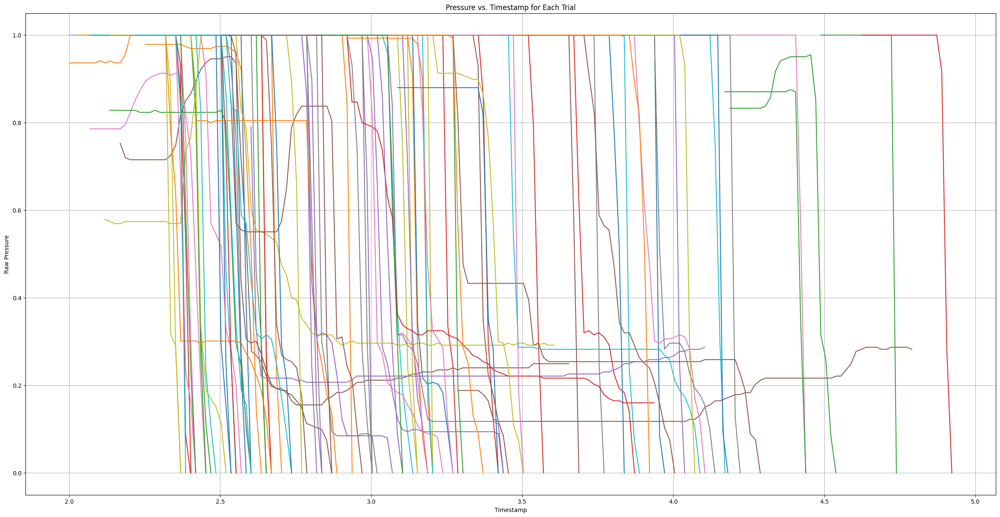

In [21]:
plt.figure(figsize=(30, 15))
for trial_number, trial_data in  data['ai']['trial_results'].items():
    plot_trial_pressure_all(trial_data, trial_number)

plt.xlabel('Timestamp')
plt.ylabel('Raw Pressure')
plt.title('Pressure vs. Timestamp for Each Trial')
#plt.legend()
plt.grid(True)
plt.show()

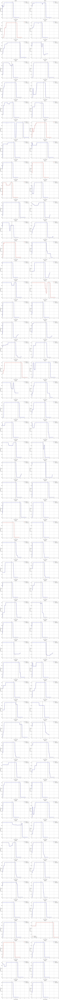

In [25]:
# plotting individual AI block trials
num_trials_ai = len(data['ai']['trial_results'])
num_cols = 2
num_rows = (num_trials_ai + 1) // 2  # Add 1 to round up

fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows), squeeze=False)  # Ensure axs is always a 2D array

ai_color = 'blue'
stop_color = 'red'

for i, (trial_number, trial_data) in enumerate(data['ai']['trial_results'].items()):
    row = i // num_cols
    col = i % num_cols
    condition = trial_data['condition']
    color = ai_color if condition == 'ai' else stop_color
    plot_trial_pressure_individual(trial_data, trial_number, axs[row, col], color=color)

plt.tight_layout()
plt.show()

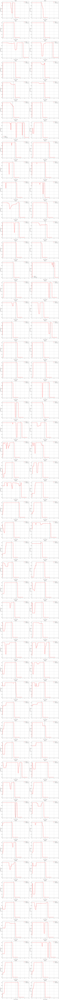

In [26]:
# non ai block trials
num_trials_ai = len(data['control']['trial_results'])
num_cols = 2
num_rows = (num_trials_ai + 1) // 2  # Add 1 to round up

fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows), squeeze=False)  # Ensure axs is always a 2D array

ai_color = 'blue'
stop_color = 'red'

for i, (trial_number, trial_data) in enumerate(data['control']['trial_results'].items()):
    row = i // num_cols
    col = i % num_cols
    condition = trial_data['condition']
    color = ai_color if condition == 'ai' else stop_color
    plot_trial_pressure_individual(trial_data, trial_number, axs[row, col], color=color)

plt.tight_layout()
plt.show()

## Subject 2

In [27]:
df = pd.read_csv(sub_2)
df['phase_raw'] = df['phase_raw'].str.strip("'")
df['block_raw'] = df['block_raw'].str.strip("'")

df_test = df.query("phase_raw == 'test'")
block_1 = df_test.query("block_raw == 'block 1'")
block_2 = df_test.query("block_raw == 'block 2'")
block_1 = block_1.reset_index(drop=True)
block_2 = block_2.reset_index(drop=True)

task_dfs = [block_1, block_2]

for df in task_dfs:
    if 'ai' in df['condition'].values:
        ai_data = df.copy()
        ai_data['distances_raw'] = ai_data['distances_raw'].apply(string_to_numbers)
        ai_data['pressures_raw'] = ai_data['pressures_raw'].apply(string_to_numbers)
        ai_data['time_stamps_raw'] = ai_data['time_stamps_raw'].apply(string_to_numbers)
    else:
        control_data = df.copy()
        control_data['distances_raw'] = control_data['distances_raw'].apply(string_to_numbers)
        control_data['pressures_raw'] = control_data['pressures_raw'].apply(string_to_numbers)
        control_data['time_stamps_raw'] = control_data['time_stamps_raw'].apply(string_to_numbers)

data = {'ai': {'data': ai_data}, 'control': {'data': control_data}}


for block in data.keys():
    trial_results, ssrt_list = process_trial_data(data[block]['data'])
    data[block]['trial_results'] = trial_results
    data[block]['ssrt_list'] = ssrt_list     

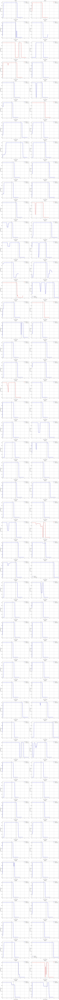

In [28]:
# ai block trials
num_trials_ai = len(data['ai']['trial_results'])
num_cols = 2
num_rows = (num_trials_ai + 1) // 2  # Add 1 to round up

fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows), squeeze=False)  # Ensure axs is always a 2D array

ai_color = 'blue'
stop_color = 'red'

for i, (trial_number, trial_data) in enumerate(data['ai']['trial_results'].items()):
    row = i // num_cols
    col = i % num_cols
    condition = trial_data['condition']
    color = ai_color if condition == 'ai' else stop_color
    plot_trial_pressure_individual(trial_data, trial_number, axs[row, col], color=color)

plt.tight_layout()
plt.show()

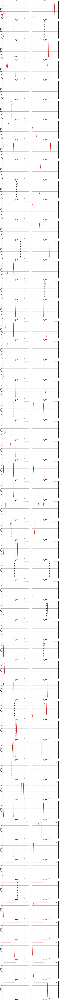

In [29]:
# non ai block trials
num_trials_ai = len(data['control']['trial_results'])
num_cols = 2
num_rows = (num_trials_ai + 1) // 2  # Add 1 to round up

fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows), squeeze=False)  # Ensure axs is always a 2D array

ai_color = 'blue'
stop_color = 'red'

for i, (trial_number, trial_data) in enumerate(data['control']['trial_results'].items()):
    row = i // num_cols
    col = i % num_cols
    condition = trial_data['condition']
    color = ai_color if condition == 'ai' else stop_color
    plot_trial_pressure_individual(trial_data, trial_number, axs[row, col], color=color)

plt.tight_layout()
plt.show()

## Subject 3

In [30]:
df = pd.read_csv(sub_3)
df['phase_raw'] = df['phase_raw'].str.strip("'")
df['block_raw'] = df['block_raw'].str.strip("'")

df_test = df.query("phase_raw == 'test'")
block_1 = df_test.query("block_raw == 'block 1'")
block_2 = df_test.query("block_raw == 'block 2'")
block_1 = block_1.reset_index(drop=True)
block_2 = block_2.reset_index(drop=True)

task_dfs = [block_1, block_2]

for df in task_dfs:
    if 'ai' in df['condition'].values:
        ai_data = df.copy()
        ai_data['distances_raw'] = ai_data['distances_raw'].apply(string_to_numbers)
        ai_data['pressures_raw'] = ai_data['pressures_raw'].apply(string_to_numbers)
        ai_data['time_stamps_raw'] = ai_data['time_stamps_raw'].apply(string_to_numbers)
    else:
        control_data = df.copy()
        control_data['distances_raw'] = control_data['distances_raw'].apply(string_to_numbers)
        control_data['pressures_raw'] = control_data['pressures_raw'].apply(string_to_numbers)
        control_data['time_stamps_raw'] = control_data['time_stamps_raw'].apply(string_to_numbers)

data = {'ai': {'data': ai_data}, 'control': {'data': control_data}}


for block in data.keys():
    trial_results, ssrt_list = process_trial_data(data[block]['data'])
    data[block]['trial_results'] = trial_results
    data[block]['ssrt_list'] = ssrt_list     

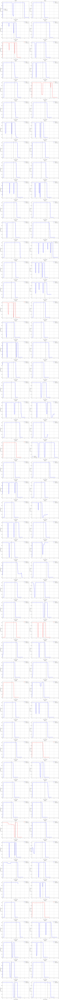

In [31]:
# ai block trials
num_trials_ai = len(data['ai']['trial_results'])
num_cols = 2
num_rows = (num_trials_ai + 1) // 2  # Add 1 to round up

fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows), squeeze=False)  # Ensure axs is always a 2D array

ai_color = 'blue'
stop_color = 'red'

for i, (trial_number, trial_data) in enumerate(data['ai']['trial_results'].items()):
    row = i // num_cols
    col = i % num_cols
    condition = trial_data['condition']
    color = ai_color if condition == 'ai' else stop_color
    plot_trial_pressure_individual(trial_data, trial_number, axs[row, col], color=color)

plt.tight_layout()
plt.show()

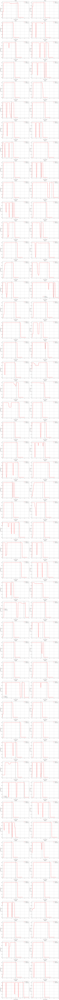

In [32]:
# non ai block trials
num_trials_ai = len(data['control']['trial_results'])
num_cols = 2
num_rows = (num_trials_ai + 1) // 2  # Add 1 to round up

fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows), squeeze=False)  # Ensure axs is always a 2D array

ai_color = 'blue'
stop_color = 'red'

for i, (trial_number, trial_data) in enumerate(data['control']['trial_results'].items()):
    row = i // num_cols
    col = i % num_cols
    condition = trial_data['condition']
    color = ai_color if condition == 'ai' else stop_color
    plot_trial_pressure_individual(trial_data, trial_number, axs[row, col], color=color)

plt.tight_layout()
plt.show()